<a href="https://colab.research.google.com/github/nrrajuu/Deep-Learning/blob/main/Customer_Segmentation_using_Time_Series_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
'''from google.colab import drive
drive.mount('/content/drive')'''

"from google.colab import drive\ndrive.mount('/content/drive')"

In [ ]:
!pip install feature_engine

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd

import datetime as dt
#import feature_engine
#from feature_engine.outliers import Winsorizer
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

import plotly.offline as pyoff
import plotly.graph_objs as go

import datetime as dt
#import feature_engine

#from feature_engine.outliers import Winsorizer

import warnings
warnings.filterwarnings("ignore")

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

import keras
import tensorflow as tf
from keras.preprocessing.sequence import TimeseriesGenerator

from keras.models import Sequential # importing sequentail model
from keras.layers import LSTM, Dense,Dropout,GRU # importing model
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import seaborn as sns
import plotly.express as px
import seaborn as sns

from sklearn.metrics import mean_absolute_error,mean_squared_error,mean_absolute_percentage_error
import math

In [ ]:
#dataset=pd.read_csv('/content/drive/MyDrive/DataCoSupplyChainDataset.csv',encoding='latin-1')
dataset=pd.read_csv('DataCoSupplyChainDataset.csv',encoding='latin-1')

In [ ]:
sports_category=['Sporting Goods', 'Boxing & MMA', 'Cardio Equipment', 'Hunting & Shooting', 'Baseball & Softball', 'Basketball', 'Soccer', 'Tennis & Racquet', 'Fitness Accessories', 'Golf Balls', 'Hockey', 'Golf Gloves', 'Golf Bags & Carts', 'Golf Shoes', 'Golf Apparel', 'Water Sports', 'Indoor/Outdoor Games']

In [ ]:
list_data=[]
for n,i in enumerate(sports_category):
  n=dataset[dataset['Category Name'] == i]
  list_data.append(n)


In [ ]:
sport_dataframe = pd.concat(list_data)

In [ ]:
sport_dataframe

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179055,DEBIT,4,4,20.389999,42.480000,Shipping on time,0,46,Indoor/Outdoor Games,Lancaster,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/5/2015 9:20,Standard Class
179056,DEBIT,6,4,-9.050000,127.449997,Late delivery,1,46,Indoor/Outdoor Games,Caguas,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/7/2015 8:16,Standard Class
179057,PAYMENT,2,4,64.410004,244.899994,Advance shipping,0,46,Indoor/Outdoor Games,Caguas,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/3/2015 6:52,Standard Class
179058,CASH,4,4,2.640000,41.980000,Shipping on time,0,46,Indoor/Outdoor Games,Granite City,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/5/2015 5:49,Standard Class


In [ ]:
sport_dataframe.shape

(54204, 53)

In [ ]:
sport_dataframe=sport_dataframe.reset_index()

In [ ]:
#dataset=dataset.loc[dataset['Category Name'].isin(['Sporting Goods', 'Boxing & MMA', 'Cardio Equipment', 'Hunting & Shooting', 'Baseball & Softball', 'Basketball', 'Soccer', 'Tennis & Racquet', 'Fitness Accessories', 'Golf Balls', 'Hockey', 'Golf Gloves', 'Golf Bags & Carts', 'Golf Shoes', 'Golf Apparel', 'Water Sports', 'Indoor/Outdoor Games'])]

In [ ]:
#dataset.shape
sport_dataframe.shape

(54204, 54)

***EDA***

In [ ]:
#dataset.head(10)

In [ ]:
#dataset_eda=dataset.copy()

In [ ]:
#dataset_eda=dataset_eda.reset_index()

In [ ]:
#dataset_eda

In [ ]:
#dataset_eda.info()

In [ ]:
#dataset_eda.head()

In [ ]:
12  #dataset_eda.tail()

In [ ]:
sport_dataframe.nunique()

index                            54204
Type                                 4
Days for shipping (real)             7
Days for shipment (scheduled)        4
Benefit per order                11677
Sales per customer                1910
Delivery Status                      4
Late_delivery_risk                   2
Category Id                         17
Category Name                       17
Customer City                      562
Customer Country                     2
Customer Email                       1
Customer Fname                     454
Customer Id                      12107
Customer Lname                    1021
Customer Password                    1
Customer Segment                     3
Customer State                      44
Customer Street                   6746
Customer Zipcode                   995
Department Id                        4
Department Name                      4
Latitude                          8038
Longitude                         4097
Market                   

In [ ]:
(sport_dataframe.isnull().sum()/(len(sport_dataframe)))*100

index                              0.000000
Type                               0.000000
Days for shipping (real)           0.000000
Days for shipment (scheduled)      0.000000
Benefit per order                  0.000000
Sales per customer                 0.000000
Delivery Status                    0.000000
Late_delivery_risk                 0.000000
Category Id                        0.000000
Category Name                      0.000000
Customer City                      0.000000
Customer Country                   0.000000
Customer Email                     0.000000
Customer Fname                     0.000000
Customer Id                        0.000000
Customer Lname                     0.000000
Customer Password                  0.000000
Customer Segment                   0.000000
Customer State                     0.000000
Customer Street                    0.000000
Customer Zipcode                   0.000000
Department Id                      0.000000
Department Name                 

In [ ]:
sport_dataframe.describe().T

,count,mean,std,min,25%,50%,75%,max
index,54204.0,90777.958509,43491.210489,0.000000,56959.750000,96942.000000,114566.250000,179608.000000
Days for shipping (real),54204.0,3.492528,1.624365,0.000000,2.000000,3.000000,5.000000,6.000000
Days for shipment (scheduled),54204.0,2.927939,1.377728,0.000000,2.000000,4.000000,4.000000,4.000000
Benefit per order,54204.0,20.804620,96.290967,-1844.979980,7.167500,31.500000,64.252501,465.500000
Sales per customer,54204.0,175.391015,98.310556,7.490000,98.949997,173.929993,197.990005,989.989990
Late_delivery_risk,54204.0,0.547709,0.497723,0.000000,0.000000,1.000000,1.000000,1.000000
Category Id,54204.0,35.654952,17.158882,2.000000,9.000000,46.000000,48.000000,73.000000
Customer Id,54204.0,6283.925411,3708.559139,1.000000,3144.000000,6186.000000,9392.000000,20755.000000
Customer Zipcode,54204.0,35830.642554,37497.090601,603.000000,725.000000,19148.000000,78040.000000,99205.000000
Department Id,54204.0,5.761586,1.849173,2.000000,3.000000,7.000000,7.000000,7.000000


In [ ]:
sport_dataframe.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
index,54204.0,NaN,NaN,NaN,90777.958509,43491.210489,0.0,56959.75,96942.0,114566.25,179608.0
Type,54204,4,DEBIT,20677,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Days for shipping (real),54204.0,NaN,NaN,NaN,3.492528,1.624365,0.0,2.0,3.0,5.0,6.0
Days for shipment (scheduled),54204.0,NaN,NaN,NaN,2.927939,1.377728,0.0,2.0,4.0,4.0,4.0
Benefit per order,54204.0,NaN,NaN,NaN,20.80462,96.290967,-1844.97998,7.1675,31.5,64.252501,465.5
Sales per customer,54204.0,NaN,NaN,NaN,175.391015,98.310556,7.49,98.949997,173.929993,197.990005,989.98999
Delivery Status,54204,4,Late delivery,29688,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Late_delivery_risk,54204.0,NaN,NaN,NaN,0.547709,0.497723,0.0,0.0,1.0,1.0,1.0
Category Id,54204.0,NaN,NaN,NaN,35.654952,17.158882,2.0,9.0,46.0,48.0,73.0
Category Name,54204,17,Indoor/Outdoor Games,19298,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
sport_dataframe.isnull().sum()

index                                0
Type                                 0
Days for shipping (real)             0
Days for shipment (scheduled)        0
Benefit per order                    0
Sales per customer                   0
Delivery Status                      0
Late_delivery_risk                   0
Category Id                          0
Category Name                        0
Customer City                        0
Customer Country                     0
Customer Email                       0
Customer Fname                       0
Customer Id                          0
Customer Lname                       0
Customer Password                    0
Customer Segment                     0
Customer State                       0
Customer Street                      0
Customer Zipcode                     0
Department Id                        0
Department Name                      0
Latitude                             0
Longitude                            0
Market                   

In [ ]:
sport_dataframe

,index,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54199,179055,DEBIT,4,4,20.389999,42.480000,Shipping on time,0,46,Indoor/Outdoor Games,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/5/2015 9:20,Standard Class
54200,179056,DEBIT,6,4,-9.050000,127.449997,Late delivery,1,46,Indoor/Outdoor Games,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/7/2015 8:16,Standard Class
54201,179057,PAYMENT,2,4,64.410004,244.899994,Advance shipping,0,46,Indoor/Outdoor Games,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/3/2015 6:52,Standard Class
54202,179058,CASH,4,4,2.640000,41.980000,Shipping on time,0,46,Indoor/Outdoor Games,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.98,0,4/5/2015 5:49,Standard Class


Text(0, 0.5, 'Number of Payments ')

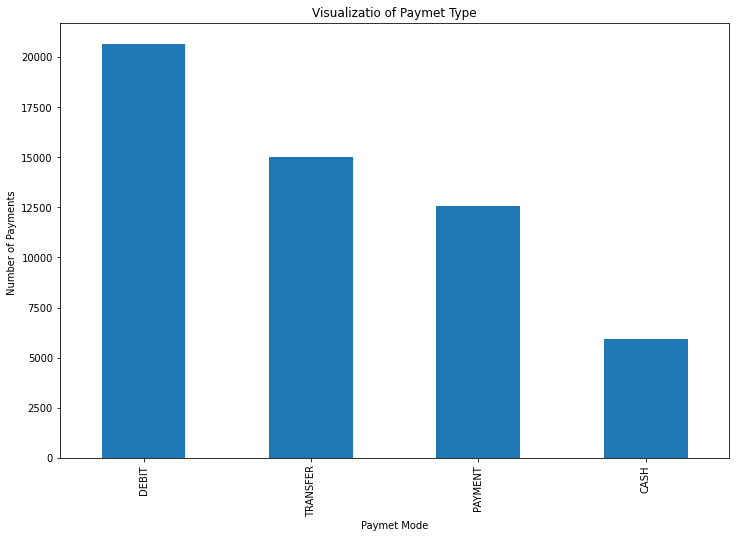

In [ ]:
sport_dataframe['Type'].value_counts().plot(kind='bar')
plt.title('Visualizatio of Paymet Type')
plt.xlabel('Paymet Mode')
plt.ylabel('Number of Payments ')

Text(0.5, 1.0, 'Visualization of Product Price Variatins over Shipping Mode')

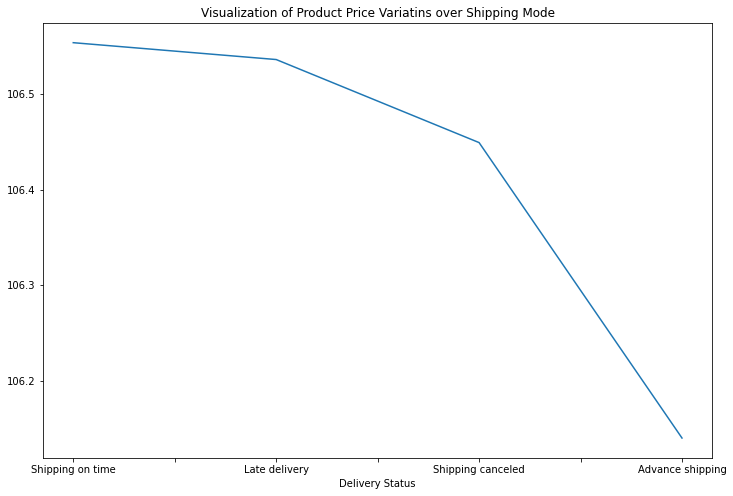

In [ ]:
sport_dataframe.groupby('Delivery Status')['Product Price'].mean().sort_values(ascending=False).plot(kind='line')
plt.title('Visualization of Product Price Variatins over Shipping Mode')

In [ ]:
sport_dataframe['Order_Date'] = pd.to_datetime(sport_dataframe['order date (DateOrders)']).dt.date

In [ ]:
NOW = dt.date(2018,1,31)

df_recency = sport_dataframe.groupby(['Customer Id'],as_index=False)['Order_Date'].max()
df_recency.columns = ['Customer Id','Last_Purchase_Date']

df_recency['Recency'] = df_recency.Last_Purchase_Date.apply(lambda x:(NOW - x).days)
df_recency.drop(columns=['Last_Purchase_Date'],inplace=True)

FM_Table = sport_dataframe.groupby('Customer Id').agg({'Order Id'   : lambda x:len(x),
                                         'Order Item Total'  : lambda x:x.sum()})

FM_Table.rename(columns = {'Order Id' :'Frequency',
                           'Order Item Total':'Monetary'},inplace= True)

RFM_Table = df_recency.merge(FM_Table,left_on='Customer Id',right_on='Customer Id')

quantiles = RFM_Table.quantile(q=[0.25,0.50,0.75])
quantiles = quantiles.to_dict()

quantiles = RFM_Table.quantile(q=[0.25,0.50,0.75])
quantiles = quantiles.to_dict()

print(quantiles)

segmented_rfm = RFM_Table.copy()


def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]:
        return 3
    else:
        return 4

def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]:
        return 2
    else:
        return 1

segmented_rfm['R_quartile'] = segmented_rfm['Recency'].apply(RScore, args=('Recency',quantiles))
segmented_rfm['F_quartile'] = segmented_rfm['Frequency'].apply(FMScore, args=('Frequency',quantiles))
segmented_rfm['M_quartile'] = segmented_rfm['Monetary'].apply(FMScore, args=('Monetary',quantiles))

segmented_rfm['RFM_Segment'] = segmented_rfm.R_quartile.map(str)+segmented_rfm.F_quartile.map(str)+segmented_rfm.M_quartile.map(str)
segmented_rfm['RFM_Score'] = segmented_rfm[['R_quartile','F_quartile','M_quartile']].sum(axis=1)

#print("Lost Cheap Customers: ",len(segmented_rfm[segmented_rfm['RFM_Segment']=='111']))
#print('Lost Customers: ',len(segmented_rfm[segmented_rfm['F_quartile']==1]))
#print("Big Spenders: ",len(segmented_rfm[segmented_rfm['M_quartile']==1]))
#print('Almost Lost: ', len(segmented_rfm[segmented_rfm['RFM_Segment']=='134']))
#print('Loyal Customers: ',len(segmented_rfm[segmented_rfm['RFM_Segment']=='344']))
#print('Best Customers: ',len(segmented_rfm[segmented_rfm['RFM_Segment']=='444']))
segmented_rfm['RFM_Score'].unique()
segmented_rfm.groupby('RFM_Score').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': ['mean', 'count'] }).round(1)

df_rfm_log = RFM_Table.copy()


{'Customer Id': {0.25: 3224.5, 0.5: 6404.0, 0.75: 9618.5}, 'Recency': {0.25: 204.0, 0.5: 333.0, 0.75: 535.0}, 'Frequency': {0.25: 2.0, 0.5: 4.0, 0.75: 6.0}, 'Monetary': {0.25: 385.94000244999995, 0.5: 685.9400177, 0.75: 1071.82500644}}


In [ ]:
segmented_rfm

,Customer Id,Recency,Frequency,Monetary,R_quartile,F_quartile,M_quartile,RFM_Segment,RFM_Score
0,1,792,1,472.450012,4,4,3,443,11
1,2,280,5,669.360016,2,2,3,223,7
2,3,229,4,555.930008,2,3,3,233,8
3,4,995,2,237.400001,4,4,4,444,12
4,5,594,3,434.090004,4,3,3,433,10
...,...,...,...,...,...,...,...,...,...
12102,19489,18,1,298.250000,1,4,4,144,9
12103,19490,18,1,304.809998,1,4,4,144,9
12104,19491,18,1,309.720001,1,4,4,144,9
12105,19492,18,1,311.359985,1,4,4,144,9


In [ ]:
df_rfm_log

,Customer Id,Recency,Frequency,Monetary
0,1,792,1,472.450012
1,2,280,5,669.360016
2,3,229,4,555.930008
3,4,995,2,237.400001
4,5,594,3,434.090004
...,...,...,...,...
12102,19489,18,1,298.250000
12103,19490,18,1,304.809998
12104,19491,18,1,309.720001
12105,19492,18,1,311.359985


In [ ]:
scaler = StandardScaler()

scaler.fit(df_rfm_log)

RFM_Table_scaled = scaler.transform(df_rfm_log)
RFM_Table_scaled = pd.DataFrame(RFM_Table_scaled, columns=df_rfm_log.columns)
RFM_Table_scaled

,Customer Id,Recency,Frequency,Monetary
0,-1.608436,1.617422,-1.271585,-0.608433
1,-1.608192,-0.478931,0.191235,-0.225407
2,-1.607947,-0.687747,-0.174470,-0.446049
3,-1.607703,2.448593,-0.905880,-1.065648
4,-1.607458,0.806723,-0.540175,-0.683050
...,...,...,...,...
12102,3.156426,-1.551673,-1.271585,-0.947284
12103,3.156670,-1.551673,-1.271585,-0.934524
12104,3.156915,-1.551673,-1.271585,-0.924973
12105,3.157159,-1.551673,-1.271585,-0.921783


In [ ]:
from scipy.spatial.distance import cdist
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1,10)

for k in K:
    #Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(RFM_Table_scaled)
    kmeanModel.fit(RFM_Table_scaled)
    inertias.append(kmeanModel.inertia_)

    mapping1[k] = sum(np.min(cdist(RFM_Table_scaled, kmeanModel.cluster_centers_,
                 'euclidean'),axis=1)) / RFM_Table_scaled.shape[0]
    mapping2[k] = kmeanModel.inertia_

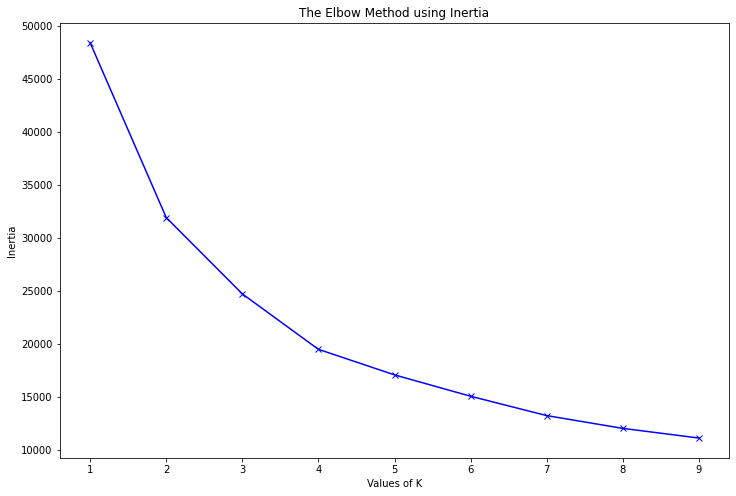

In [ ]:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

In [ ]:
def kmeans(normalised_df_rfm, clusters_number, original_df_rfm):

    kmeans = KMeans(n_clusters = clusters_number, random_state = 1)
    kmeans.fit(normalised_df_rfm)

    # Extract cluster labels
    cluster_labels = kmeans.labels_

    # Create a cluster label column in original dataset
    df_new = original_df_rfm.assign(Cluster = cluster_labels)

    # Initialise TSNE
    model = TSNE(random_state=1)
    transformed = model.fit_transform(df_new)

    # Plot t-SNE
    plt.title('Flattened Graph of {} Clusters'.format(clusters_number))
    sns.scatterplot(x=transformed[:,0], y=transformed[:,1], hue=cluster_labels, style=cluster_labels, palette="Set1")

    return df_new

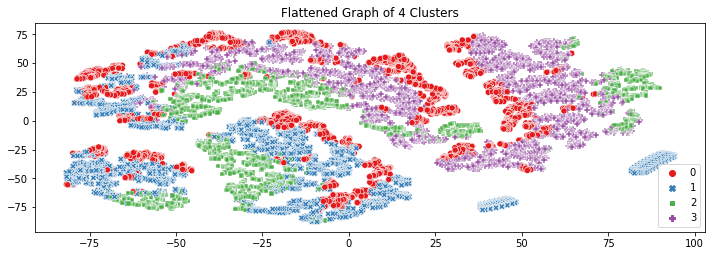

In [ ]:
plt.figure(figsize=(10, 10))
plt.subplot(3, 1, 1)
df_rfm_k3 = kmeans(RFM_Table_scaled, 4, RFM_Table)
plt.tight_layout()

In [ ]:
a=df_rfm_k3.iloc[:,0:-1].values
b=df_rfm_k3.iloc[:,-1].values

<Figure size 1080x1080 with 0 Axes>

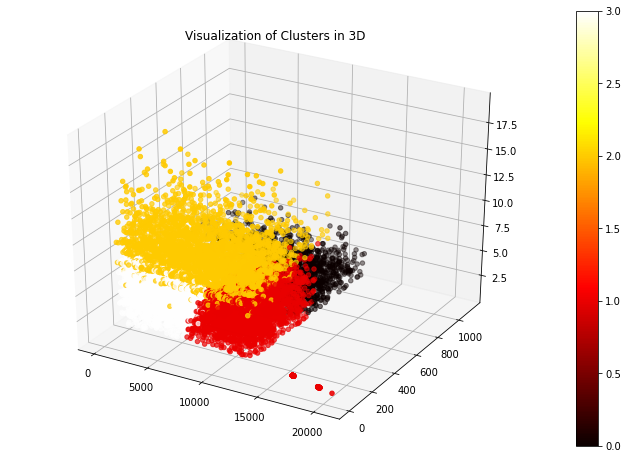

In [ ]:

plt.figure(figsize=(15, 15))
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter(a[:,0], a[:,1], a[:,2], a[:,3], c=b, cmap=plt.hot())
fig.colorbar(img)
plt.title('Visualization of Clusters in 3D')
plt.show()

In [ ]:
dataset_final=pd.merge(df_rfm_k3, sport_dataframe, on ='Customer Id')

In [ ]:
dataset_final

,Customer Id,Recency,Frequency,Monetary,Cluster,index,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,...,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,Order_Date
0,1,792,1,472.450012,0,9138,DEBIT,6,4,159.690002,...,191,9,NaN,http://images.acmesports.sports/Nike+Men%27s+F...,Nike Men's Free 5.0+ Running Shoe,99.989998,0,12/7/2015 22:18,Standard Class,2015-12-01
1,2,280,5,669.360016,3,55188,DEBIT,4,4,87.360001,...,1073,48,NaN,http://images.acmesports.sports/Pelican+Sunstr...,Pelican Sunstream 100 Kayak,199.990005,0,4/30/2017 2:40,Standard Class,2017-04-26
2,2,280,5,669.360016,3,79562,DEBIT,6,4,-41.889999,...,1073,48,NaN,http://images.acmesports.sports/Pelican+Sunstr...,Pelican Sunstream 100 Kayak,199.990005,0,5/15/2016 8:04,Standard Class,2016-05-09
3,2,280,5,669.360016,3,106166,DEBIT,4,4,64.099998,...,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.980000,0,4/30/2017 2:40,Standard Class,2017-04-26
4,2,280,5,669.360016,3,106167,DEBIT,4,4,22.670000,...,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.980000,0,4/30/2017 2:40,Standard Class,2017-04-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54199,19489,18,1,298.250000,1,4,PAYMENT,2,4,134.210007,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 11:24,Standard Class,2018-01-13
54200,19490,18,1,304.809998,1,3,DEBIT,3,4,22.860001,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/16/2018 11:45,Standard Class,2018-01-13
54201,19491,18,1,309.720001,1,2,CASH,4,4,-247.779999,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class,2018-01-13
54202,19492,18,1,311.359985,1,1,TRANSFER,5,4,-249.089996,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class,2018-01-13


In [ ]:
dataset_final=dataset_final[['Order_Date','Order Item Quantity']]

In [ ]:
dataset_final

,Order_Date,Order Item Quantity
0,2015-12-01,5
1,2017-04-26,1
2,2016-05-09,1
3,2017-04-26,3
4,2017-04-26,2
...,...,...
54199,2018-01-13,1
54200,2018-01-13,1
54201,2018-01-13,1
54202,2018-01-13,1


In [ ]:
seasonal_df=dataset_final.copy()

In [ ]:
#seasonal_df.set_index('Order_Date', inplace=True)

In [ ]:
seasonal_df

,Order_Date,Order Item Quantity
0,2015-12-01,5
1,2017-04-26,1
2,2016-05-09,1
3,2017-04-26,3
4,2017-04-26,2
...,...,...
54199,2018-01-13,1
54200,2018-01-13,1
54201,2018-01-13,1
54202,2018-01-13,1


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
seasonal_df = seasonal_df.set_index('Order_Date')

In [ ]:
from pylab import rcParams


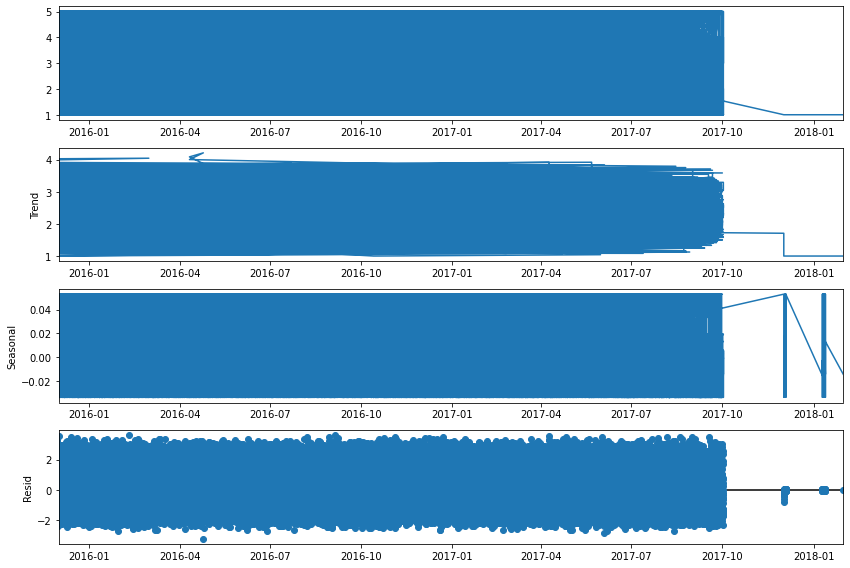

In [ ]:
decompose_result = seasonal_decompose(seasonal_df, model='additive', freq=12, extrapolate_trend=12)
rcParams['figure.figsize'] = 12, 8

trend = decompose_result.trend
seasonal = decompose_result.seasonal
residual = decompose_result.resid

decompose_result.plot();

***Long Short Term Memroy (LSTM) - RRN ( Recurrent Neural Networks)***

In [ ]:
dataset_final

,Order_Date,Order Item Quantity
0,2015-12-01,5
1,2017-04-26,1
2,2016-05-09,1
3,2017-04-26,3
4,2017-04-26,2
...,...,...
54199,2018-01-13,1
54200,2018-01-13,1
54201,2018-01-13,1
54202,2018-01-13,1


In [ ]:
def cluster_time_series_Analysis_LSTM(cluster_number):
   dataset_final_C=dataset_final[dataset_final['Cluster']==cluster_number]
   extracted_features=dataset_final_C[['Order_Date','Order Item Quantity']]
   df = extracted_features.rename(columns={'Order Item Quantity': 'Order_Item_Quantity'})
   df['Order_Date'].value_counts()
   dff=df.groupby('Order_Date').Order_Item_Quantity.sum()
   final_df=pd.DataFrame(dff)
   final_df=final_df.reset_index()
   close_data_initial = final_df['Order_Item_Quantity'].values # data that we need
   close_data_initial = close_data_initial.reshape((-1,1)) # converting the data into 2D shape
   scaler = MinMaxScaler()
   close_data = scaler.fit_transform(close_data_initial) # transforming the input data
   split_percent = 0.90 # training data percentage
   split = int(split_percent*len(close_data))
   close_train = close_data[:split]
   close_test = close_data[split:]
   date_train = final_df['Order_Date'][:split]
   date_test = final_df['Order_Date'][split:]
   print(len(close_train))
   print(len(close_test))
   look_back = 32 # this is in 32 days
   train_generator = TimeseriesGenerator(close_train, close_train, length=look_back, batch_size=16)   # train data generator
   test_generator = TimeseriesGenerator(close_test, close_test, length=look_back, batch_size=16) # test data generator
   model = Sequential() # creating model
   model.add(
     LSTM(50,
         activation='relu',
         input_shape=(look_back,1))
   )
   model.add(Dense(64,activation='relu'))
   model.add(Dense(48,activation='relu'))
   model.add(Dense(16,activation='relu'))
   model.add(Dense(1)) # output layer
   model.compile(optimizer='adam', loss='mse') # compling the model with adam optimizer
   num_epochs = 50 # number of epochs
   model.fit_generator(train_generator, epochs=num_epochs,validation_data=test_generator, verbose=1)# training the data for 100 epochs
   prediction = model.predict_generator(test_generator) # prediction on test data
   date_testa=date_test[:-32] # -32 because of look back was 32
   close_test=close_test[:-32]# -32 because of look back was 32
   close_train = scaler.inverse_transform(close_train.reshape(-1,1))
   close_test = scaler.inverse_transform(close_test.reshape(-1,1))
   prediction = scaler.inverse_transform(prediction.reshape(-1,1))
   vis_df=pd.DataFrame(columns=['Date','Orginal','Predicted'])
   vis_df['Date']=date_testa
   vis_df['Orginal']=close_test
   vis_df['Predicted']=prediction
   mae=mean_absolute_error(vis_df['Orginal'],vis_df['Predicted'])
   mse=mean_squared_error(vis_df['Orginal'],vis_df['Predicted'])
   mape=mean_absolute_percentage_error(vis_df['Orginal'],vis_df['Predicted'])
   rmse=math.sqrt(mse)

   print('The MAE(Mean Absolute Error is',mae)
   print('The MSE(Mean square Error is',mse)
   print('The MAPE(Mean Absolute Percentage Error is',mape)
   print('The RMSE( Root Mean Square error is',rmse)

   plt.figure(figsize=(15, 7))
   sns.lineplot(x='Date',y='Orginal',data=vis_df,label='Orginal')
   sns.lineplot(x='Date',y='Orginal',data=vis_df,label='Orginal')
   sns.lineplot(x='Date',y='Predicted',data=vis_df,label='Predicted')
   plt.ylabel('Daily Demand')
   plt.xlabel('Date')
   plt.legend()
   plt.title('Visualization of Orginal and Predicted Demand for cluster {}'.format(cluster_number))

In [ ]:
close_train

NameError: ignored

In [ ]:
cluster_time_series_Analysis_LSTM(0)

KeyError: ignored

909
101
Epoch 1/50
55/55 [==============================] - 2s 17ms/step - loss: 0.0340 - val_loss: 0.0311
Epoch 2/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0175 - val_loss: 0.0309
Epoch 3/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0173 - val_loss: 0.0319
Epoch 4/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0167 - val_loss: 0.0334
Epoch 5/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0165 - val_loss: 0.0338
Epoch 6/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0165 - val_loss: 0.0373
Epoch 7/50
55/55 [==============================] - 1s 24ms/step - loss: 0.0166 - val_loss: 0.0328
Epoch 8/50
55/55 [==============================] - 1s 27ms/step - loss: 0.0163 - val_loss: 0.0320
Epoch 9/50
55/55 [==============================] - 1s 15ms/step - loss: 0.0166 - val_loss: 0.0328
Epoch 10/50
55/55 [==============================] - 1s 25ms/step - loss: 0.0162 - val_loss: 0.0326
E

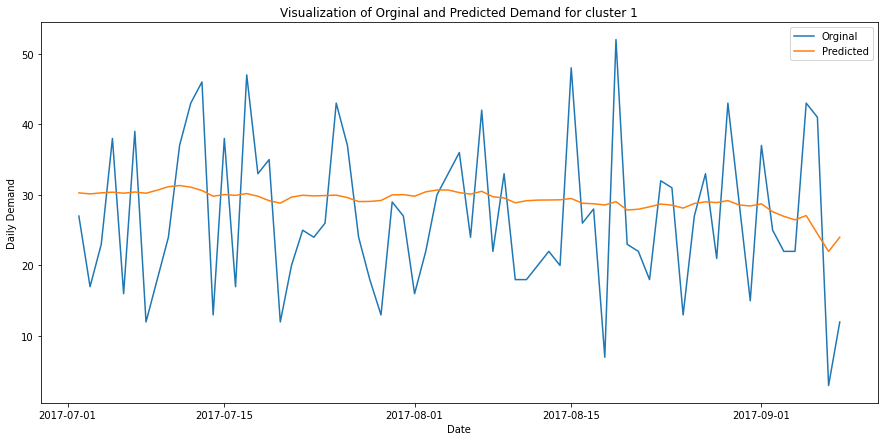

In [ ]:
cluster_time_series_Analysis_LSTM(1)

905
101
Epoch 1/50
55/55 [==============================] - 2s 17ms/step - loss: 0.0361 - val_loss: 0.0224
Epoch 2/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0224 - val_loss: 0.0224
Epoch 3/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0224 - val_loss: 0.0241
Epoch 4/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0224 - val_loss: 0.0222
Epoch 5/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0223 - val_loss: 0.0239
Epoch 6/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0225 - val_loss: 0.0244
Epoch 7/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0224 - val_loss: 0.0236
Epoch 8/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0229 - val_loss: 0.0228
Epoch 9/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0227 - val_loss: 0.0229
Epoch 10/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0221 - val_loss: 0.0231
E

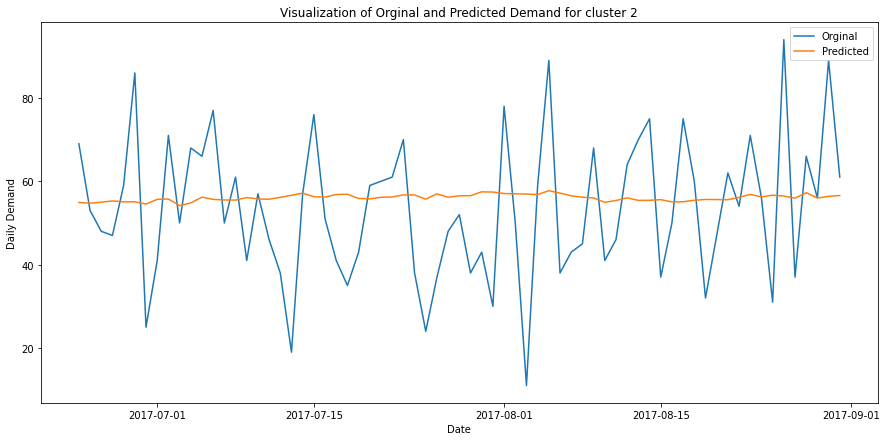

In [ ]:
cluster_time_series_Analysis_LSTM(2)

905
101
Epoch 1/50
55/55 [==============================] - 2s 17ms/step - loss: 0.0421 - val_loss: 0.0258
Epoch 2/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0251 - val_loss: 0.0276
Epoch 3/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0238 - val_loss: 0.0269
Epoch 4/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0234 - val_loss: 0.0291
Epoch 5/50
55/55 [==============================] - 1s 15ms/step - loss: 0.0235 - val_loss: 0.0259
Epoch 6/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0233 - val_loss: 0.0259
Epoch 7/50
55/55 [==============================] - 1s 15ms/step - loss: 0.0235 - val_loss: 0.0259
Epoch 8/50
55/55 [==============================] - 1s 13ms/step - loss: 0.0233 - val_loss: 0.0260
Epoch 9/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0239 - val_loss: 0.0272
Epoch 10/50
55/55 [==============================] - 1s 14ms/step - loss: 0.0236 - val_loss: 0.0259
E

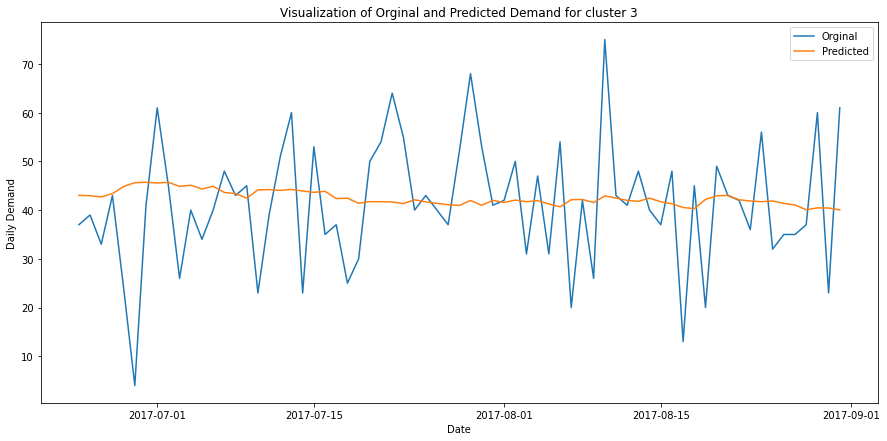

In [ ]:
cluster_time_series_Analysis_LSTM(3)

***Gradient Recurrent Units - RRN ( Recurrent Neural Networks)***

In [ ]:
def cluster_time_series_Analysis_GRU(cluster_number):
   dataset_final_C=dataset_final[dataset_final['Cluster']==cluster_number]
   extracted_features=dataset_final_C[['Order_Date','Order Item Quantity']]
   df = extracted_features.rename(columns={'Order Item Quantity': 'Order_Item_Quantity'})
   df['Order_Date'].value_counts()
   dff=df.groupby('Order_Date').Order_Item_Quantity.sum()
   final_df=pd.DataFrame(dff)
   final_df=final_df.reset_index()
   close_data_initial = final_df['Order_Item_Quantity'].values # data that we need
   close_data_initial = close_data_initial.reshape((-1,1)) # converting the data into 2D shape
   scaler = MinMaxScaler()
   close_data = scaler.fit_transform(close_data_initial) # transforming the input data
   split_percent = 0.80 # training data percentage
   split = int(split_percent*len(close_data))
   close_train = close_data[:split]
   close_test = close_data[split:]
   date_train = final_df['Order_Date'][:split]
   date_test = final_df['Order_Date'][split:]
   print(len(close_train))
   print(len(close_test))
   look_back = 32# this is in hrs
   train_generator = TimeseriesGenerator(close_train, close_train, length=look_back, batch_size=16)   # train data generator
   test_generator = TimeseriesGenerator(close_test, close_test, length=look_back, batch_size=16) # test data generator
   model = Sequential() # creating model
   model.add(
     GRU(100,
         activation='relu',
         input_shape=(look_back,1))
   )
   model.add(Dense(64,activation='relu'))
   model.add(Dense(48,activation='relu'))
   model.add(Dense(16,activation='relu'))
   model.add(Dense(1)) # output layer
   model.compile(optimizer='adam', loss='mse') # compling the model with adam optimizer
   num_epochs = 200 # number of epochs
   model.fit_generator(train_generator, epochs=num_epochs,validation_data=test_generator, verbose=1)# training the data for 100 epochs
   prediction = model.predict_generator(test_generator) # prediction on test data
   date_testa=date_test[:-32] # -3 because of look back was 3
   close_test=close_test[:-32]# -3 because of look back was 3
   close_train = scaler.inverse_transform(close_train.reshape(-1,1))
   close_test = scaler.inverse_transform(close_test.reshape(-1,1))
   prediction = scaler.inverse_transform(prediction.reshape(-1,1))
   vis_df=pd.DataFrame(columns=['Date','Orginal','Predicted'])
   vis_df['Date']=date_testa
   vis_df['Orginal']=close_test
   vis_df['Predicted']=prediction
   mae=mean_absolute_error(vis_df['Orginal'],vis_df['Predicted'])
   mse=mean_squared_error(vis_df['Orginal'],vis_df['Predicted'])
   mape=mean_absolute_percentage_error(vis_df['Orginal'],vis_df['Predicted'])
   rmse=math.sqrt(mse)

   print('The MAE(Mean Absolute Error is',mae)
   print('The MSE(Mean square Error is',mse)
   print('The MAPE(Mean Absolute Percentage Error is',mape)
   print('The RMSE( Root Mean Square error is',rmse)

   plt.figure(figsize=(15, 7))
   sns.lineplot(x='Date',y='Orginal',data=vis_df,label='Orginal')
   sns.lineplot(x='Date',y='Predicted',data=vis_df,label='Predicted')
   plt.ylabel('Daily Demand')
   plt.xlabel('Date')
   plt.legend()
   plt.title('Visualization of Orginal and Predicted Demand for cluster {}'.format(cluster_number))

532
133
Epoch 1/200
32/32 [==============================] - 4s 44ms/step - loss: 0.0801 - val_loss: 0.0404
Epoch 2/200
32/32 [==============================] - 1s 19ms/step - loss: 0.0314 - val_loss: 0.0346
Epoch 3/200
32/32 [==============================] - 1s 29ms/step - loss: 0.0316 - val_loss: 0.0457
Epoch 4/200
32/32 [==============================] - 1s 33ms/step - loss: 0.0316 - val_loss: 0.0374
Epoch 5/200
32/32 [==============================] - 1s 18ms/step - loss: 0.0316 - val_loss: 0.0555
Epoch 6/200
32/32 [==============================] - 1s 19ms/step - loss: 0.0316 - val_loss: 0.0507
Epoch 7/200
32/32 [==============================] - 1s 20ms/step - loss: 0.0321 - val_loss: 0.0453
Epoch 8/200
32/32 [==============================] - 1s 18ms/step - loss: 0.0315 - val_loss: 0.0512
Epoch 9/200
32/32 [==============================] - 1s 17ms/step - loss: 0.0312 - val_loss: 0.0549
Epoch 10/200
32/32 [==============================] - 1s 17ms/step - loss: 0.0321 - val_loss

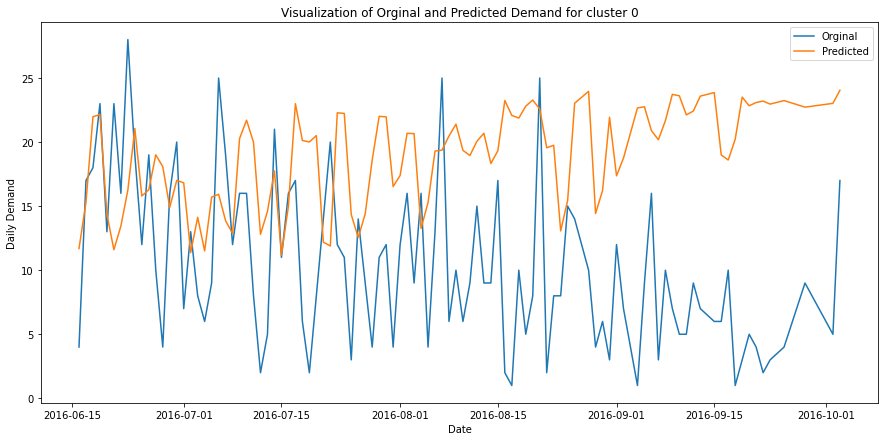

In [ ]:
cluster_time_series_Analysis_GRU(0)

808
202
Epoch 1/200
49/49 [==============================] - 3s 23ms/step - loss: 0.0302 - val_loss: 0.0290
Epoch 2/200
49/49 [==============================] - 1s 19ms/step - loss: 0.0172 - val_loss: 0.0316
Epoch 3/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0182 - val_loss: 0.0242
Epoch 4/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0171 - val_loss: 0.0224
Epoch 5/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0167 - val_loss: 0.0270
Epoch 6/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0164 - val_loss: 0.0245
Epoch 7/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0158 - val_loss: 0.0236
Epoch 8/200
49/49 [==============================] - 1s 19ms/step - loss: 0.0159 - val_loss: 0.0297
Epoch 9/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0159 - val_loss: 0.0234
Epoch 10/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0154 - val_loss

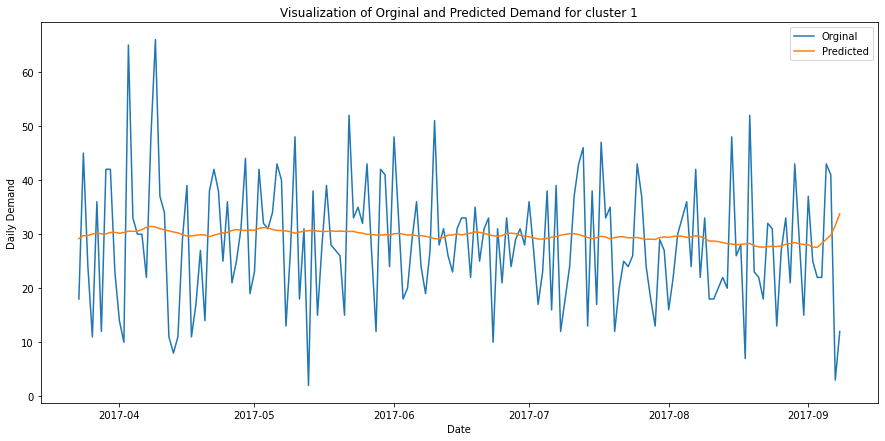

In [ ]:
cluster_time_series_Analysis_GRU(1)

804
202
Epoch 1/200
49/49 [==============================] - 3s 23ms/step - loss: 0.0776 - val_loss: 0.0242
Epoch 2/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0220 - val_loss: 0.0235
Epoch 3/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0219 - val_loss: 0.0234
Epoch 4/200
49/49 [==============================] - 1s 20ms/step - loss: 0.0218 - val_loss: 0.0240
Epoch 5/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0215 - val_loss: 0.0233
Epoch 6/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0220 - val_loss: 0.0238
Epoch 7/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0220 - val_loss: 0.0252
Epoch 8/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0219 - val_loss: 0.0241
Epoch 9/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0216 - val_loss: 0.0239
Epoch 10/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0217 - val_loss

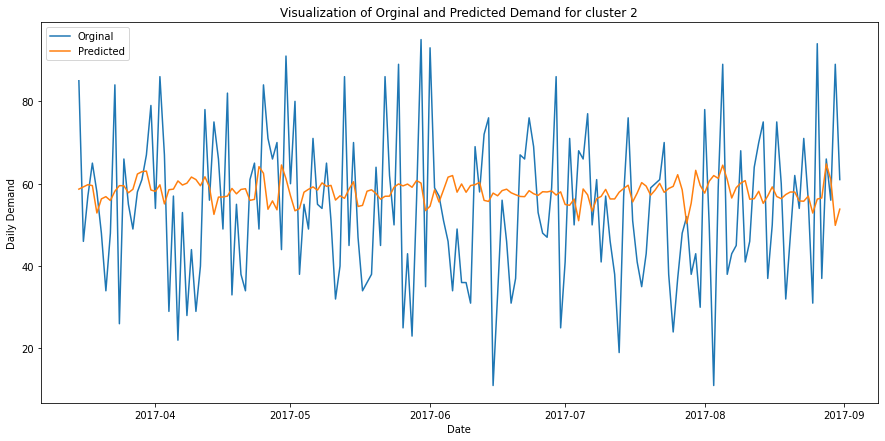

In [ ]:
cluster_time_series_Analysis_GRU(2)

804
202
Epoch 1/200
49/49 [==============================] - 3s 23ms/step - loss: 0.0460 - val_loss: 0.0250
Epoch 2/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0240 - val_loss: 0.0243
Epoch 3/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0233 - val_loss: 0.0243
Epoch 4/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0236 - val_loss: 0.0253
Epoch 5/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0231 - val_loss: 0.0240
Epoch 6/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0229 - val_loss: 0.0256
Epoch 7/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0231 - val_loss: 0.0238
Epoch 8/200
49/49 [==============================] - 1s 17ms/step - loss: 0.0229 - val_loss: 0.0265
Epoch 9/200
49/49 [==============================] - 1s 20ms/step - loss: 0.0230 - val_loss: 0.0237
Epoch 10/200
49/49 [==============================] - 1s 18ms/step - loss: 0.0227 - val_loss

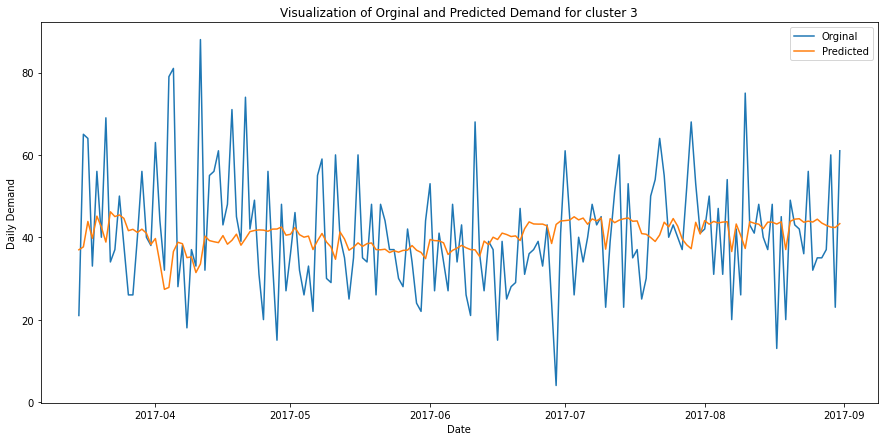

In [ ]:
cluster_time_series_Analysis_GRU(3)

***Prophet Model - Time Series Forecasting***

In [ ]:
#!pip install pystan==2.18.0.0

In [ ]:
#!pip install fbprophet

In [ ]:
def Prophet(cluster_number):
  dataset_final_C=dataset_final[dataset_final['Cluster']==cluster_number]
  from fbprophet import Prophet
  from fbprophet.plot import plot_plotly
  import plotly.offline as py
  py.init_notebook_mode()
  my_model = Prophet(interval_width=0.90)
  extracted_features=dataset_final_C[['Order_Date','Order Item Quantity']]
  extracted_features = extracted_features.rename(columns={'Order_Date': 'ds',
                        'Order Item Quantity': 'y'})
  model = Prophet(daily_seasonality=True)
  model.fit(extracted_features);
  future = model.make_future_dataframe(periods=24, freq = 'd')
  forecast = model.predict(future)
  forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

  metric_df = forecast.set_index('ds')[['yhat']].join(extracted_features.set_index('ds').y).reset_index()
  metric_df.dropna(inplace=True)
  mae=mean_absolute_error(metric_df.y, metric_df.yhat)
  mse=mean_squared_error(metric_df.y, metric_df.yhat)
  mape=mean_absolute_percentage_error(metric_df.y, metric_df.yhat)
  rmse=math.sqrt(mse)

  print('The MAE(Mean Absolute Error) is',mae)
  print('The MSE(Mean square Error) is',mse)
  print('The MAPE(Mean Absolute Percentage Error) is',mape)
  print('The RMSE( Root Mean Square error) is',rmse)

  plt.figure(figsize=(15, 7))
  sns.lineplot(x='ds',y='y',data=metric_df.sample(100),label='Orginal')
  sns.lineplot(x='ds',y='yhat',data=metric_df.sample(100),label='Predicted')
  plt.ylabel('Daily Demand')
  plt.xlabel('Date')
  plt.legend()
  plt.title('Visualization of Orginal and Predicted Demand for cluster {}'.format(cluster_number))

The MAE(Mean Absolute Error) is 1.315853653873796
The MSE(Mean square Error) is 2.1732756281721657
The MAPE(Mean Absolute Percentage Error) is 0.7832315420700614
The RMSE( Root Mean Square error) is 1.4742033876545548


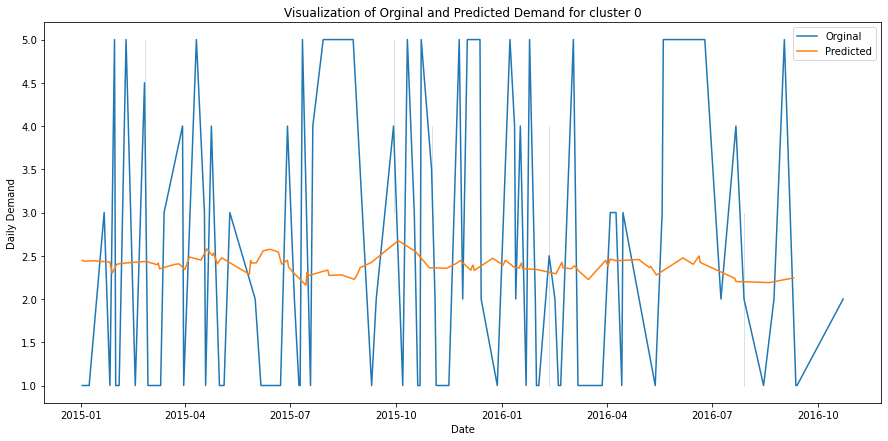

In [ ]:
Prophet(0)

The MAE(Mean Absolute Error) is 1.2607823054583698
The MSE(Mean square Error) is 2.070440648157715
The MAPE(Mean Absolute Percentage Error) is 0.756616302545361
The RMSE( Root Mean Square error) is 1.4389025846657288


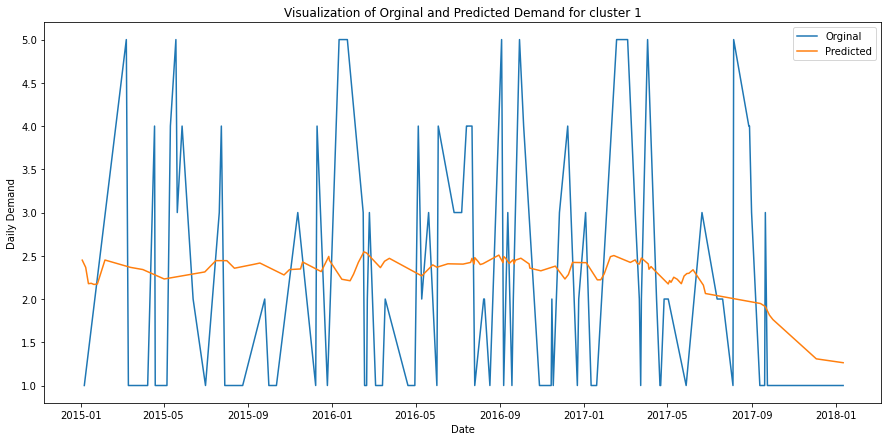

In [ ]:
Prophet(1)

The MAE(Mean Absolute Error) is 1.3682429969937933
The MSE(Mean square Error) is 2.299129466075826
The MAPE(Mean Absolute Percentage Error) is 0.8109789183603607
The RMSE( Root Mean Square error) is 1.5162880551121631


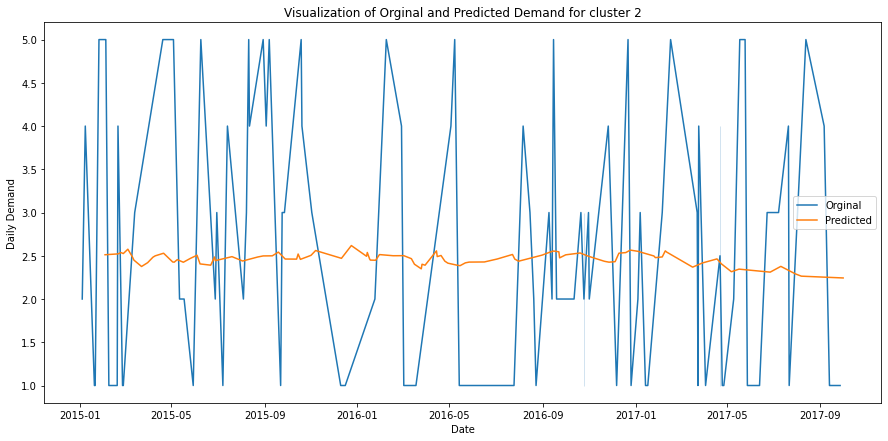

In [ ]:
Prophet(2)

The MAE(Mean Absolute Error) is 1.3178841501048506
The MSE(Mean square Error) is 2.190003009703674
The MAPE(Mean Absolute Percentage Error) is 0.7893436677785154
The RMSE( Root Mean Square error) is 1.47986587557916


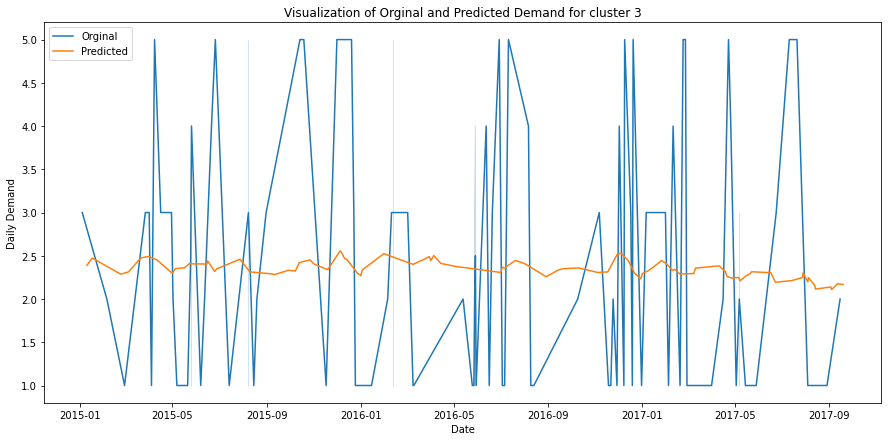

In [ ]:
Prophet(3)